<a href="https://colab.research.google.com/github/amkorousagi/PLA_AI/blob/main/data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 런타임 재시작 마다 실행해야함
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent cache directory
/root/.fontconfig: not cleaning non-existent cache directory
fc-cache: succeeded


In [ ]:
# basic 
import time
import random
import math

#data analytics
import numpy as np
import pandas as pd

#Math
import scipy as sp
import statsmodels.api as sm

#web crawling
import requests
from bs4 import BeautifulSoup

#visualization
import matplotlib as mpl
import matplotlib.pylab as plb
import matplotlib.pyplot as plt
import sklearn as sk
import seaborn as sns

# 브라우저에서 바로 그려지도록 
%matplotlib inline

# 그래프에 retina display 적용
%config InlineBackend.figure_format = 'retina'

# Colab 의 한글 폰트 설정
plt.rc('font', family='NanumBarunGothic') 

# 유니코드에서  음수 부호설정
mpl.rc('axes', unicode_minus=False)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import matplotlib.font_manager as fm
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
font_list

['/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareRoundB.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareRoundR.ttf',
 '/usr/share/fonts/truetype/humor-sans/Humor-Sans.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-Italic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Italic.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBarunGothicBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareR.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationMono-Italic.ttf',
 '/usr/share/fonts/truetype/nanum/NanumMyeongjo.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf',
 '/usr/shar

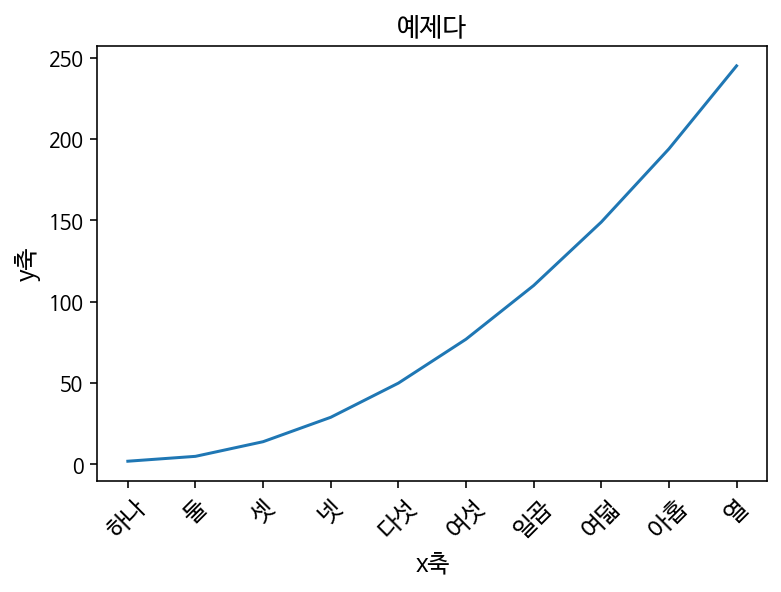

In [ ]:
plt.plot([x for x in range(0, 10)], [(3*y**2)+2 for y in range(0, 10)])
plt.title("예제다", fontsize= 13)
plt.xlabel("x축", fontsize= 12)
plt.xticks(np.arange(0, 10, 1), ['하나', '둘', '셋', '넷', '다섯', '여섯', '일곱', '여덟', '아홉', '열'], fontsize= 12, rotation= 45)
plt.ylabel("y축", fontsize= 12)
plt.show()
# ????

In [ ]:
df = pd.read_excel("/content/format_indexed.xlsx",index_col=[0])
df = df.loc[:,~df.columns.str.contains("^Unnamed")]

df.index = range(len(df));
df = df.drop([0,1])
# df.describe(include='all')
df.head()
num_df = pd.DataFrame()
for col in df:
  num_df[col] = pd.to_numeric(df[col],errors='coerce')
num_df.describe(include="all")

,레시피:Dorosperse Yellow KKL,레시피:Dorosperse Red KKL,레시피:Dorosperse Blue KKL,레시피:Dianix Yellow AM-2R,레시피:Dianix Red AM-SLR,레시피:Dianix Blue AM-2G,레시피:Synolon Yellow AK,레시피:Synolon Red AK,레시피:Synolon Blue AK,레시피:Dorosperse B/K KKL,레시피:Dianix Black AM-SLR,레시피:Synolon Black AK-NB,레시피:Dorosperse Dark Grey KKL,레시피:Dianix Grey AM-SLR,레시피:Synolon Dark Grey AK,레시피:Dianix Yellow Brown AM-R,레시피:Dorosperse Brown K-3LR,레시피:Synofast 28,Lab 배합:Lab 배합 시료 무게,Lab 배합:Lab 배합 용수량,Lab 배합:Lab 배합 조제 #3 명,Lab 배합:Lab 배합 조제 #4 명,Lab 염색:Lab 염색 기계 ID,Lab 염색:Lab 염색 기계명,Lab 염색:Lab 염색 상승속도 #3,Lab 염색:Lab 염색 상승온도 #3,Lab 염색:Lab 염색 하강속도 #1,Lab 후처리:Lab 후처리 기계ID,Lab 후처리:Lab 후처리 기계명,Lab 후처리:Lab 후처리 조제 #1 투입량,Lab 후처리:Lab 후처리 조제 #2 투입량,Lab 후처리:Lab 후처리 환원세정 용수량,Lab 후가공 후 검사:L*,Lab 후가공 후 검사:a*,Lab 후가공 후 검사:b*,Lab 후가공 후 검사:K/S,내광성 시험 전 검사:L*,내광성 시험 전 검사:a*,내광성 시험 전 검사:b*,내광성 시험 후 검사:L*,내광성 시험 후 검사:a*,내광성 시험 후 검사:b*,내광성 시험 후 검사:내광성등급,내광성 시험 후 검사:색차
count,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000
mean,0.088609,0.080630,0.060285,0.060285,0.060285,0.060285,0.061614,0.060285,0.060285,0.167553,0.167553,0.167553,0.167553,0.167553,0.167553,0.083777,0.083777,0.083777,5.184840,0.051848,0.430851,0.430851,0.430851,0.430851,1.476285,135.430851,1.984189,0.430851,0.430851,1.715426,1.715426,0.051848,48.073351,11.773457,9.953883,5.340486,48.466170,11.131117,9.816197,52.281941,11.241888,9.684149,2.473404,5.476800
std,0.371499,0.339655,0.285553,0.285553,0.285553,0.285553,0.286434,0.285553,0.285553,0.836571,0.836571,0.836571,0.836571,0.836571,0.836571,0.418286,0.418286,0.418286,1.363602,0.013636,0.730666,0.730666,0.495855,0.495855,0.020661,0.495855,0.013775,0.495855,0.495855,0.247928,0.247928,0.013636,20.156388,20.490823,25.225140,4.852655,19.441521,19.937054,24.703419,20.050473,17.552074,23.101825,0.994966,2.799772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.040000,0.000000,0.000000,0.000000,0.000000,1.458333,135.000000,1.972220,0.000000,0.000000,1.500000,1.500000,0.040000,16.970000,-18.520000,-30.230000,0.121100,17.500000,-18.240000,-29.930000,19.360000,-11.830000,-22.640000,1.000000,0.410000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.040000,0.000000,0.000000,0.000000,0.000000,1.458333,135.000000,1.972220,0.000000,0.000000,1.500000,1.500000,0.040000,30.550000,-0.322500,-2.062500,1.515575,31.512500,-0.440000,-1.837500,34.535000,-0.245000,-2.932500,1.500000,3.092500
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.040000,0.000000,0.000000,0.000000,0.000000,1.458333,135.000000,1.972220,0.000000,0.000000,1.500000,1.500000,0.040000,48.670000,6.645000,0.220000,3.963100,49.055000,6.475000,0.290000,51.680000,6.765000,1.180000,2.000000,5.570000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.750000,0.067500,1.000000,1.000000,1.000000,1.000000,1.500000,136.000000,2.000000,1.000000,1.000000,2.000000,2.000000,0.067500,64.940000,21.777500,17.407500,8.379550,64.750000,20.277500,16.785000,69.397500,20.075000,14.780000,3.500000,7.820000
max,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.0

In [ ]:
df.head(5)

,레시피:Dorosperse Yellow KKL,레시피:Dorosperse Red KKL,레시피:Dorosperse Blue KKL,레시피:Dianix Yellow AM-2R,레시피:Dianix Red AM-SLR,레시피:Dianix Blue AM-2G,레시피:Synolon Yellow AK,레시피:Synolon Red AK,레시피:Synolon Blue AK,레시피:Dorosperse B/K KKL,레시피:Dianix Black AM-SLR,레시피:Synolon Black AK-NB,레시피:Dorosperse Dark Grey KKL,레시피:Dianix Grey AM-SLR,레시피:Synolon Dark Grey AK,레시피:Dianix Yellow Brown AM-R,레시피:Dorosperse Brown K-3LR,레시피:Synofast 28,Lab 배합:Lab 배합 시료 무게,Lab 배합:Lab 배합 용수량,Lab 배합:Lab 배합 조제 #3 명,Lab 배합:Lab 배합 조제 #4 명,Lab 염색:Lab 염색 기계 ID,Lab 염색:Lab 염색 기계명,Lab 염색:Lab 염색 상승속도 #3,Lab 염색:Lab 염색 상승온도 #3,Lab 염색:Lab 염색 하강속도 #1,Lab 후처리:Lab 후처리 기계ID,Lab 후처리:Lab 후처리 기계명,Lab 후처리:Lab 후처리 조제 #1 투입량,Lab 후처리:Lab 후처리 조제 #2 투입량,Lab 후처리:Lab 후처리 환원세정 용수량,Lab 후가공 후 검사:L*,Lab 후가공 후 검사:a*,Lab 후가공 후 검사:b*,Lab 후가공 후 검사:K/S,내광성 시험 전 검사:L*,내광성 시험 전 검사:a*,내광성 시험 전 검사:b*,내광성 시험 후 검사:L*,내광성 시험 후 검사:a*,내광성 시험 후 검사:b*,내광성 시험 후 검사:내광성등급,내광성 시험 후 검사:색차
2,0.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0.04,0,0,0,0,1.45833,135,1.97222,0,0,1.5,1.5,0.04,79.38,10.48,66.66,2.1246,79.15,7.49,63.03,82.19,12.12,62.25,3.5,5.67333
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0.04,0,0,0,0,1.45833,135,1.97222,0,0,1.5,1.5,0.04,76.12,17.96,76.31,3.9342,75.83,14.91,74.03,78.3,18.93,72.91,3.5,4.93
4,1.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0.04,0,0,0,0,1.45833,135,1.97222,0,0,1.5,1.5,0.04,73.9,21.36,78.4,5.1668,73.7,18.95,77.57,76.54,22.88,76.71,3.5,4.93
5,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0.04,0,0,0,0,1.45833,135,1.97222,0,0,1.5,1.5,0.04,72.61,24.74,81.07,6.6044,72.58,21.31,78.93,74.55,26.46,79.48,3.5,5.56667
6,2.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0.04,0,0,0,0,1.45833,135,1.97222,0,0,1.5,1.5,0.04,70.15,28.32,80.86,8.3645,69.72,26.58,80.48,71.93,31.29,80.62,3.5,5.28333


In [ ]:
df.describe(include="all")

,레시피:Dorosperse Yellow KKL,레시피:Dorosperse Red KKL,레시피:Dorosperse Blue KKL,레시피:Dianix Yellow AM-2R,레시피:Dianix Red AM-SLR,레시피:Dianix Blue AM-2G,레시피:Synolon Yellow AK,레시피:Synolon Red AK,레시피:Synolon Blue AK,레시피:Dorosperse B/K KKL,레시피:Dianix Black AM-SLR,레시피:Synolon Black AK-NB,레시피:Dorosperse Dark Grey KKL,레시피:Dianix Grey AM-SLR,레시피:Synolon Dark Grey AK,레시피:Dianix Yellow Brown AM-R,레시피:Dorosperse Brown K-3LR,레시피:Synofast 28,Lab 배합:Lab 배합 시료 무게,Lab 배합:Lab 배합 용수량,Lab 배합:Lab 배합 조제 #3 명,Lab 배합:Lab 배합 조제 #4 명,Lab 염색:Lab 염색 기계 ID,Lab 염색:Lab 염색 기계명,Lab 염색:Lab 염색 상승속도 #3,Lab 염색:Lab 염색 상승온도 #3,Lab 염색:Lab 염색 하강속도 #1,Lab 후처리:Lab 후처리 기계ID,Lab 후처리:Lab 후처리 기계명,Lab 후처리:Lab 후처리 조제 #1 투입량,Lab 후처리:Lab 후처리 조제 #2 투입량,Lab 후처리:Lab 후처리 환원세정 용수량,Lab 후가공 후 검사:L*,Lab 후가공 후 검사:a*,Lab 후가공 후 검사:b*,Lab 후가공 후 검사:K/S,내광성 시험 전 검사:L*,내광성 시험 전 검사:a*,내광성 시험 전 검사:b*,내광성 시험 후 검사:L*,내광성 시험 후 검사:a*,내광성 시험 후 검사:b*,내광성 시험 후 검사:내광성등급,내광성 시험 후 검사:색차
count,376,376,376,376,376,376,376,376,376,376,376,376,376,376,376,376,376,376,376.0,376.00,376,376,376,376,376.000000,376,376.00000,376,376,376.0,376.0,376.00,376.0,376.00,376.00,376.000,376.00,376.0,376.00,376.00,376.00,376.00,376,376.000000
unique,16,16,16,16,16,16,16,16,16,7,7,7,7,7,7,7,7,7,2.0,2.00,3,3,2,2,2.000000,2,2.00000,2,2,2.0,2.0,2.00,362.0,330.00,340.00,372.000,362.00,330.0,339.00,371.00,332.00,350.00,9,350.000000
top,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.0,0.04,0,0,0,0,1.458333,135,1.97222,0,0,1.5,1.5,0.04,26.9,-0.07,-1.28,10.696,75.37,0.0,-1.45,57.18,0.06,-2.19,1.5,4.413333
freq,330,331,338,338,338,338,337,338,338,358,358,358,358,358,358,358,358,358,214.0,214.00,268,268,214,214,214.000000,214,214.00000,214,214,214.0,214.0,214.00,3.0,4.00,6.00,2.000,2.00,5.0,3.00,2.00,3.00,3.00,135,3.000000


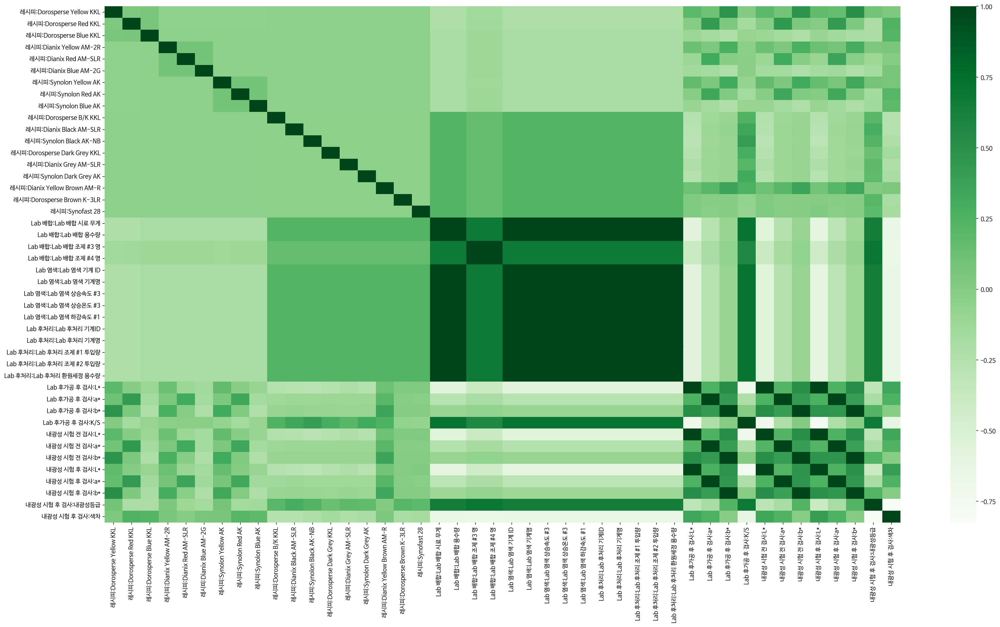

In [ ]:
# 상관성 분석

num_col = ['Lab 배합:Lab 배합 시료 무게','Lab 배합:Lab 배합 용수량','Lab 염색:Lab 염색 상승속도 #3','Lab 염색:Lab 염색 상승온도 #3','Lab 염색:Lab 염색 하강속도 #1','Lab 후처리:Lab 후처리 조제 #1 투입량','Lab 후처리:Lab 후처리 조제 #2 투입량','Lab 후처리:Lab 후처리 환원세정 용수량','Lab 후가공 후 검사:L*','Lab 후가공 후 검사:a*','Lab 후가공 후 검사:b*','Lab 후가공 후 검사:K/S','내광성 시험 전 검사:L*','내광성 시험 전 검사:a*','내광성 시험 전 검사:b*','내광성 시험 후 검사:L*','내광성 시험 후 검사:a*','내광성 시험 후 검사:b*','내광성 시험 후 검사:내광성등급','내광성 시험 후 검사:색차','레시피:Dorosperse Yellow KKL', '레시피:Dorosperse Red KKL','레시피:Dorosperse Blue KKL','레시피:Dianix Yellow AM-2R','레시피:Dianix Red AM-SLR','레시피:Dianix Blue AM-2G','레시피:Synolon Yellow AK','레시피:Synolon Red AK','레시피:Synolon Blue AK','레시피:Dorosperse B/K KKL','레시피:Dianix Black AM-SLR','레시피:Synolon Black AK-NB','레시피:Dorosperse Dark Grey KKL','레시피:Dianix Grey AM-SLR','레시피:Synolon Dark Grey AK','레시피:Dianix Yellow Brown AM-R','레시피:Dorosperse Brown K-3LR','레시피:Synofast 28']



corr = num_df.corr()

# 그래프 크기 조절
# sns.set(rc = {'figure.figsize':(30,16)})
plt.figure(figsize = (30,16))


sns.heatmap(corr,cmap="Greens",linecolor='lightgray')

# mask = np.zeros_like(corr,dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

# fig, ax = plt.subplots()

# vmax = np.abs(corr.values[~mask]).max()
# sns.heatmap(corr, mask=mask, cmap=plt.cm.PuOr,vmin=vmax,vmax=vmax,square=True,linecolor='lightgray',linewidths=1,ax=ax)
# for i in range(len(corr)):
#   ax.text(i+0.5,len(corr)-(i+0.5),corr.columns[i]) # ha="center",va="center",rotation=45)
#   for j in range(i+1,len(corr)):
#     s = "{:.3f}".format(corr.values[i,j])
#     ax.text(j+0.5,len(corr)-(i+0.5),s,ha="center",va="center")
# ax.axis('off')
# plt.show()

In [ ]:
# 내광성 기준 컬럼들을 상관 계수 절대값을 기준으로 내림차순 정렬

sorted(corr['내광성 시험 후 검사:내광성등급'],key=abs,reverse=True)
idx = corr.sort_values('내광성 시험 후 검사:내광성등급',ascending=False).index
corr.loc[:,idx].iloc[len(corr)-2]

내광성 시험 후 검사:내광성등급               1.000000
Lab 배합:Lab 배합 조제 #4 명           0.701740
Lab 배합:Lab 배합 조제 #3 명           0.701740
Lab 후가공 후 검사:K/S                0.675170
Lab 배합:Lab 배합 시료 무게             0.644877
Lab 후처리:Lab 후처리 환원세정 용수량        0.644877
Lab 배합:Lab 배합 용수량               0.644877
Lab 염색:Lab 염색 상승온도 #3           0.644877
Lab 후처리:Lab 후처리 조제 #1 투입량       0.644877
Lab 후처리:Lab 후처리 조제 #2 투입량       0.644877
Lab 염색:Lab 염색 기계 ID             0.644877
Lab 염색:Lab 염색 기계명               0.644877
Lab 후처리:Lab 후처리 기계명             0.644877
Lab 후처리:Lab 후처리 기계ID            0.644877
Lab 염색:Lab 염색 하강속도 #1           0.644877
Lab 염색:Lab 염색 상승속도 #3           0.644877
레시피:Dianix Black AM-SLR         0.287297
내광성 시험 후 검사:b*                  0.240800
레시피:Synolon Black AK-NB         0.239241
내광성 시험 전 검사:b*                  0.237288
Lab 후가공 후 검사:b*                 0.233545
레시피:Dorosperse Brown K-3LR      0.221621
레시피:Dorosperse B/K KKL          0.205602
레시피:Synofast 28                 0.187981
레시피:Dianix Grey 

In [ ]:
num_df.shape

(376, 44)

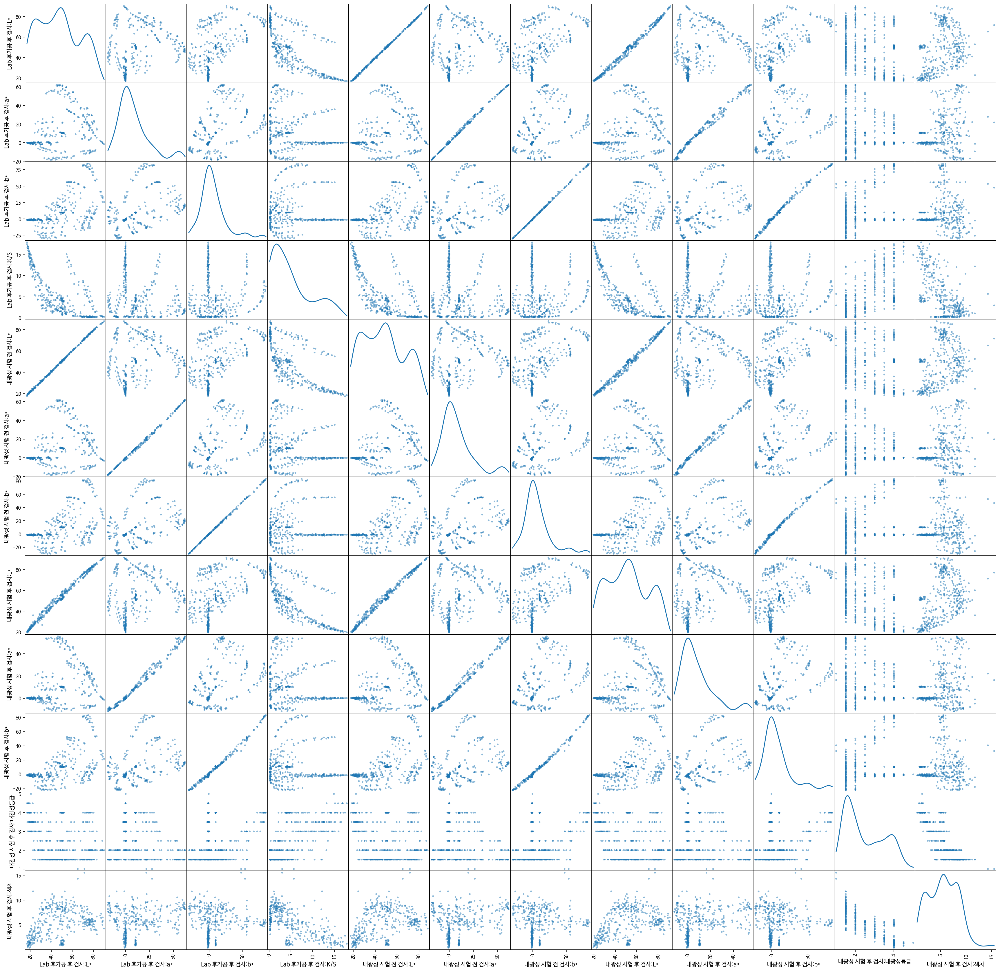

In [ ]:
# 산점도 분석 주요 변수
from pandas.plotting import scatter_matrix

good_col = ['Lab 후가공 후 검사:L*','Lab 후가공 후 검사:a*','Lab 후가공 후 검사:b*','Lab 후가공 후 검사:K/S','내광성 시험 전 검사:L*','내광성 시험 전 검사:a*','내광성 시험 전 검사:b*','내광성 시험 후 검사:L*','내광성 시험 후 검사:a*','내광성 시험 후 검사:b*','내광성 시험 후 검사:내광성등급','내광성 시험 후 검사:색차']
good_df = num_df[good_col]

scatter_matrix(good_df, 

               alpha=0.5, 

               figsize=(30, 30), 

               diagonal='kde')

plt.show()

In [ ]:
# 산점도 분석 전체 변수

scatter_matrix(num_df, 

               alpha=0.5, 

               figsize=(100, 100), 

               diagonal='kde')

plt.show()

(array([  2., 135.,  69.,  26.,  39.,  38.,  59.,   8.]),
 array([1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <a list of 8 Patch objects>)

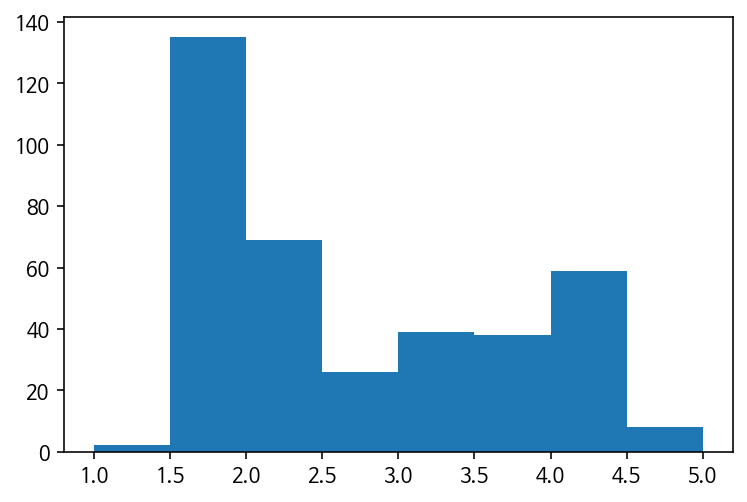

In [ ]:
# 히스토그램 분석 목적 변수만

plt.hist(num_df['내광성 시험 후 검사:내광성등급'],bins=8)

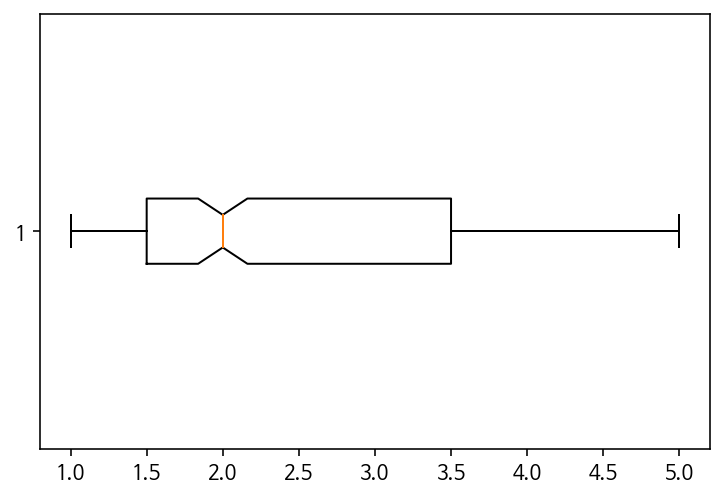

In [ ]:
plt.boxplot(num_df['내광성 시험 후 검사:내광성등급'], 

            notch=1, # if 'True' then notched box plot

            sym='rs', # symbol: red square

            vert=0 # vertical : if 'False' then horizontal box plot

           )

plt.show()